# Step 1: HYCOM Ocean Current — Exploratory Data Analysis

This notebook explores the HYCOM GLBy0.08 global ocean surface current data via **OPeNDAP remote access**.

**Structure:**
- **Section 1** — 2024 single-year EDA (run this first to validate)
- **Section 2** — 2022–2024 multi-year comparison
- **Section 3** — Key findings summary

**Data source:** https://tds.hycom.org/thredds/catalogs/GLBy0.08/expt_93.0_uv3z.html

## 0. Configuration & Imports

In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import warnings, time

warnings.filterwarnings("ignore", category=FutureWarning)
plt.rcParams.update({"figure.dpi": 120, "font.size": 10})

# ── HYCOM OPeNDAP endpoints (one per year) ──
HYCOM_BASE = "http://tds.hycom.org/thredds/dodsC/GLBy0.08/expt_93.0/uv3z"

# ── Helper: open a year lazily (metadata only, no data transfer) ──
_handles = {}
def hycom(year):
    """Return a lazy xarray Dataset for one HYCOM year (surface u/v only)."""
    if year not in _handles:
        url = f"{HYCOM_BASE}/{year}"
        ds = xr.open_dataset(url, decode_times=True,
                             drop_variables=["tau"], chunks={"time": 1})
        _handles[year] = ds
    return _handles[year]

# ── Helper: fetch a single surface snapshot ──
def snapshot(year, date_str, stride=4):
    """
    Download ONE timestep of global surface u/v.
    stride=4 → every 4th grid point (0.32° res, ~16x faster than full).
    stride=1 → full 0.08° resolution (slow, use only when needed).
    """
    ds = hycom(year)
    t = ds.sel(time=date_str, method="nearest", depth=0)[["water_u", "water_v"]]
    if stride > 1:
        t = t.isel(lat=slice(None, None, stride), lon=slice(None, None, stride))
    return t.load()

# ── Helper: fetch surface data for a small time window ──
def window(year, start, end, stride=4):
    """Download a time-window of global surface u/v (spatially subsampled)."""
    ds = hycom(year)
    t = ds.sel(time=slice(start, end), depth=0)[["water_u", "water_v"]]
    if stride > 1:
        t = t.isel(lat=slice(None, None, stride), lon=slice(None, None, stride))
    return t.load()

print("Imports and helpers ready.")

Imports and helpers ready.


---
## 1. 2024 Single-Year EDA

### 1.1 Dataset Overview

Connect to HYCOM 2024 via OPeNDAP and inspect metadata (dimensions, variables, resolution). **No data is downloaded in this cell.**

In [2]:
# ── 1.1 Connect & inspect metadata ──
ds24 = hycom(2024)

print("=== HYCOM 2024 Dataset Overview ===")
print(f"Dimensions : {dict(ds24.dims)}")
print(f"Variables  : {list(ds24.data_vars)}")
print(f"Coordinates: {list(ds24.coords)}")
print()
print(f"Time  : {str(ds24.time.values[0])[:19]}  →  {str(ds24.time.values[-1])[:19]}")
print(f"         {ds24.dims['time']} timesteps  "
      f"(~{(ds24.time.values[-1]-ds24.time.values[0])/np.timedelta64(1,'h')/ds24.dims['time']:.1f} h interval)")
print(f"Lat   : {float(ds24.lat.min()):.2f}  →  {float(ds24.lat.max()):.2f}   "
      f"({ds24.dims['lat']} points, Δ≈{float(ds24.lat.diff('lat').median()):.4f}°)")
print(f"Lon   : {float(ds24.lon.min()):.2f}  →  {float(ds24.lon.max()):.2f}  "
      f"({ds24.dims['lon']} points, Δ≈{float(ds24.lon.diff('lon').median()):.4f}°)")
print(f"Depth : {ds24.depth.values}  ({ds24.dims['depth']} levels)")
print()
print("Key variables:")
for v in ["water_u", "water_v"]:
    da = ds24[v]
    print(f"  {v:10s}  dims={da.dims}  dtype={da.dtype}  units={da.attrs.get('units','?')}")
    print(f"             long_name: {da.attrs.get('long_name','?')}")

=== HYCOM 2024 Dataset Overview ===
Dimensions : {'depth': 40, 'lat': 4251, 'lon': 4500, 'time': 1984}
Variables  : ['water_u', 'water_u_bottom', 'water_v', 'water_v_bottom']
Coordinates: ['depth', 'lat', 'lon', 'time']

Time  : 2024-01-01T12:00:00  →  2024-09-05T09:00:00
         1984 timesteps  (~3.0 h interval)
Lat   : -80.00  →  90.00   (4251 points, Δ≈0.0400°)
Lon   : 0.00  →  359.92  (4500 points, Δ≈0.0800°)
Depth : [0.00e+00 2.00e+00 4.00e+00 6.00e+00 8.00e+00 1.00e+01 1.20e+01 1.50e+01
 2.00e+01 2.50e+01 3.00e+01 3.50e+01 4.00e+01 4.50e+01 5.00e+01 6.00e+01
 7.00e+01 8.00e+01 9.00e+01 1.00e+02 1.25e+02 1.50e+02 2.00e+02 2.50e+02
 3.00e+02 3.50e+02 4.00e+02 5.00e+02 6.00e+02 7.00e+02 8.00e+02 9.00e+02
 1.00e+03 1.25e+03 1.50e+03 2.00e+03 2.50e+03 3.00e+03 4.00e+03 5.00e+03]  (40 levels)

Key variables:
  water_u     dims=('time', 'depth', 'lat', 'lon')  dtype=float32  units=m/s
             long_name: Eastward Water Velocity
  water_v     dims=('time', 'depth', 'lat', 'lon')  dt

### 1.2 Global Surface Current Snapshot

Download **one timestep** (2024-07-01) of surface u/v and visualize current speed globally.

Done in 26.0s  (grid: 1063×1125)


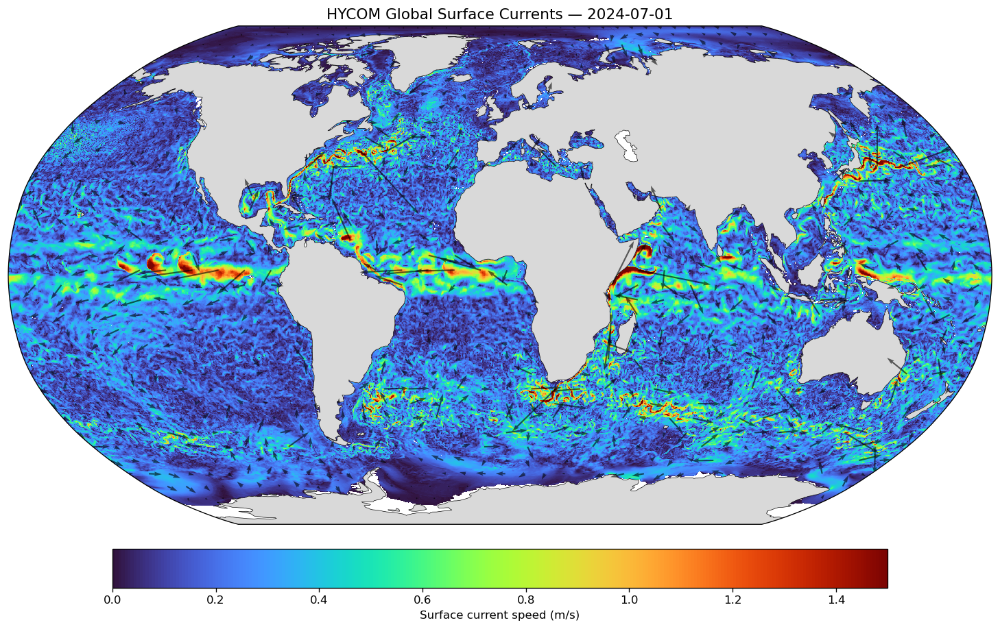

In [3]:
# ── 1.2 Global snapshot — 2024-07-01 ──
# stride=4 → 0.32° resolution, ~16x faster than full grid
print("Downloading single timestep (2024-07-01, depth=0, stride=4) ...")
t0 = time.time()
snap = snapshot(2024, "2024-07-01", stride=4)
print(f"Done in {time.time()-t0:.1f}s  "
      f"(grid: {snap.dims['lat']}×{snap.dims['lon']})")

u = snap["water_u"].values
v = snap["water_v"].values
speed = np.sqrt(u**2 + v**2)

# Convert lon from 0-360 to -180-180 for nicer global map
lon = snap.lon.values
lat = snap.lat.values
lon180 = np.where(lon > 180, lon - 360, lon)
sort_idx = np.argsort(lon180)
lon180 = lon180[sort_idx]
speed_s = speed[:, sort_idx]
u_s = u[:, sort_idx]
v_s = v[:, sort_idx]

fig, ax = plt.subplots(figsize=(16, 8), subplot_kw={"projection": ccrs.Robinson()})
ax.set_global()
ax.add_feature(cfeature.LAND, facecolor="0.85", zorder=2)
ax.add_feature(cfeature.COASTLINE, linewidth=0.4, zorder=3)

lon2d, lat2d = np.meshgrid(lon180, lat)
pcm = ax.pcolormesh(lon2d, lat2d, speed_s, cmap="turbo",
                     transform=ccrs.PlateCarree(), vmin=0, vmax=1.5, shading="auto")
cb = plt.colorbar(pcm, ax=ax, orientation="horizontal", pad=0.04,
                  shrink=0.6, label="Surface current speed (m/s)")

# Quiver overlay (heavily subsampled)
skip = 30
ax.quiver(lon2d[::skip, ::skip], lat2d[::skip, ::skip],
          u_s[::skip, ::skip], v_s[::skip, ::skip],
          transform=ccrs.PlateCarree(), scale=25, width=0.0015,
          alpha=0.6, zorder=4)

date_str = str(snap.time.values)[:10]
ax.set_title(f"HYCOM Global Surface Currents — {date_str}", fontsize=13)
plt.tight_layout()
plt.show()

### 1.3 Global Surface Current Speed — Statistical Distribution

Sample the 1st of each month in 2024 (12 snapshots) to build a statistical profile of global surface current speeds.

In [4]:
# ── 1.3 Speed statistics from 12 monthly snapshots ──
sample_dates = [f"2024-{m:02d}-01" for m in range(1, 13)]

all_speeds = []
monthly_mean_speeds = []

print("Downloading 12 monthly snapshots (surface only) ...")
t0 = time.time()
for d in sample_dates:
    s = snapshot(2024, d)
    spd = np.sqrt(s["water_u"].values**2 + s["water_v"].values**2)
    all_speeds.append(spd)
    monthly_mean_speeds.append(np.nanmean(spd))
    print(f"  {d}  mean={np.nanmean(spd):.4f} m/s  max={np.nanmax(spd):.2f} m/s")
print(f"Done in {time.time()-t0:.1f}s")

# Stack into one big array for global stats
all_spd = np.concatenate([s.ravel() for s in all_speeds])
all_spd = all_spd[~np.isnan(all_spd)]

print(f"\n=== Global Surface Speed Statistics (2024, 12 snapshots) ===")
print(f"  Count : {all_spd.size:,}")
print(f"  Mean  : {all_spd.mean():.4f} m/s")
print(f"  Median: {np.median(all_spd):.4f} m/s")
print(f"  Std   : {all_spd.std():.4f} m/s")
print(f"  Min   : {all_spd.min():.4f} m/s")
print(f"  Max   : {all_spd.max():.2f} m/s")
for p in [25, 50, 75, 90, 95, 99]:
    print(f"  P{p:02d}   : {np.percentile(all_spd, p):.4f} m/s")

  2024-01-01  mean=0.2286 m/s  max=2.64 m/s
  2024-02-01  mean=0.2482 m/s  max=2.70 m/s
  2024-03-01  mean=0.2408 m/s  max=2.64 m/s
  2024-04-01  mean=0.2345 m/s  max=2.79 m/s
  2024-05-01  mean=0.2276 m/s  max=2.89 m/s
  2024-06-01  mean=0.2353 m/s  max=2.70 m/s
  2024-07-01  mean=0.2353 m/s  max=2.88 m/s
  2024-08-01  mean=0.2344 m/s  max=3.22 m/s
  2024-09-01  mean=0.2431 m/s  max=3.00 m/s
  2024-10-01  mean=0.2319 m/s  max=3.12 m/s
  2024-11-01  mean=0.2319 m/s  max=3.12 m/s
  2024-12-01  mean=0.2319 m/s  max=3.12 m/s
Done in 287.9s

=== Global Surface Speed Statistics (2024, 12 snapshots) ===
  Count : 9,963,732
  Mean  : 0.2353 m/s
  Median: 0.1870 m/s
  Std   : 0.2010 m/s
  Min   : 0.0000 m/s
  Max   : 3.22 m/s
  P25   : 0.0980 m/s
  P50   : 0.1870 m/s
  P75   : 0.3109 m/s
  P90   : 0.4698 m/s
  P95   : 0.6067 m/s
  P99   : 1.0002 m/s


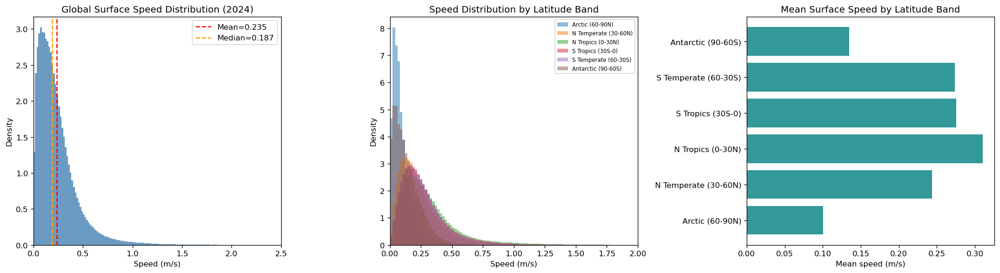

In [5]:
# ── 1.3b Histogram & latitude-band comparison ──

lat_vals = snap.lat.values  # reuse from snapshot cell

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# (a) Global histogram
ax = axes[0]
ax.hist(all_spd, bins=150, range=(0, 2.5), density=True, color="steelblue", alpha=0.8)
ax.axvline(all_spd.mean(), color="red", ls="--", label=f"Mean={all_spd.mean():.3f}")
ax.axvline(np.median(all_spd), color="orange", ls="--", label=f"Median={np.median(all_spd):.3f}")
ax.set_xlabel("Speed (m/s)")
ax.set_ylabel("Density")
ax.set_title("Global Surface Speed Distribution (2024)")
ax.legend()
ax.set_xlim(0, 2.5)

# (b) Speed by latitude band
bands = {
    "Arctic (60-90N)":   (60, 90),
    "N Temperate (30-60N)": (30, 60),
    "N Tropics (0-30N)": (0, 30),
    "S Tropics (30S-0)": (-30, 0),
    "S Temperate (60-30S)": (-60, -30),
    "Antarctic (90-60S)": (-90, -60),
}

ax = axes[1]
band_means = {}
for label, (lat_lo, lat_hi) in bands.items():
    mask = (lat_vals >= lat_lo) & (lat_vals < lat_hi)
    if mask.sum() == 0:
        continue
    band_spd = np.concatenate([s[mask, :].ravel() for s in all_speeds])
    band_spd = band_spd[~np.isnan(band_spd)]
    ax.hist(band_spd, bins=100, range=(0, 2.0), density=True, alpha=0.5, label=label)
    band_means[label] = band_spd.mean()
ax.set_xlabel("Speed (m/s)")
ax.set_ylabel("Density")
ax.set_title("Speed Distribution by Latitude Band")
ax.legend(fontsize=7)
ax.set_xlim(0, 2.0)

# (c) Bar chart of mean speed by band
ax = axes[2]
ax.barh(list(band_means.keys()), list(band_means.values()), color="teal", alpha=0.8)
ax.set_xlabel("Mean speed (m/s)")
ax.set_title("Mean Surface Speed by Latitude Band")

plt.tight_layout()
plt.show()

### 1.4 Monthly Mean Speed & Seasonality

Analyze how surface current speeds vary across months. We also examine key oceanographic regions.

C:\Users\22785\AppData\Local\Temp\ipykernel_24548\2383449755.py:15: RuntimeWarning: Mean of empty slice
  avg = np.nanmean(np.stack([all_speeds[i] for i in idxs]), axis=0)
C:\Users\22785\AppData\Local\Temp\ipykernel_24548\2383449755.py:15: RuntimeWarning: Mean of empty slice
  avg = np.nanmean(np.stack([all_speeds[i] for i in idxs]), axis=0)
C:\Users\22785\AppData\Local\Temp\ipykernel_24548\2383449755.py:15: RuntimeWarning: Mean of empty slice
  avg = np.nanmean(np.stack([all_speeds[i] for i in idxs]), axis=0)
C:\Users\22785\AppData\Local\Temp\ipykernel_24548\2383449755.py:15: RuntimeWarning: Mean of empty slice
  avg = np.nanmean(np.stack([all_speeds[i] for i in idxs]), axis=0)


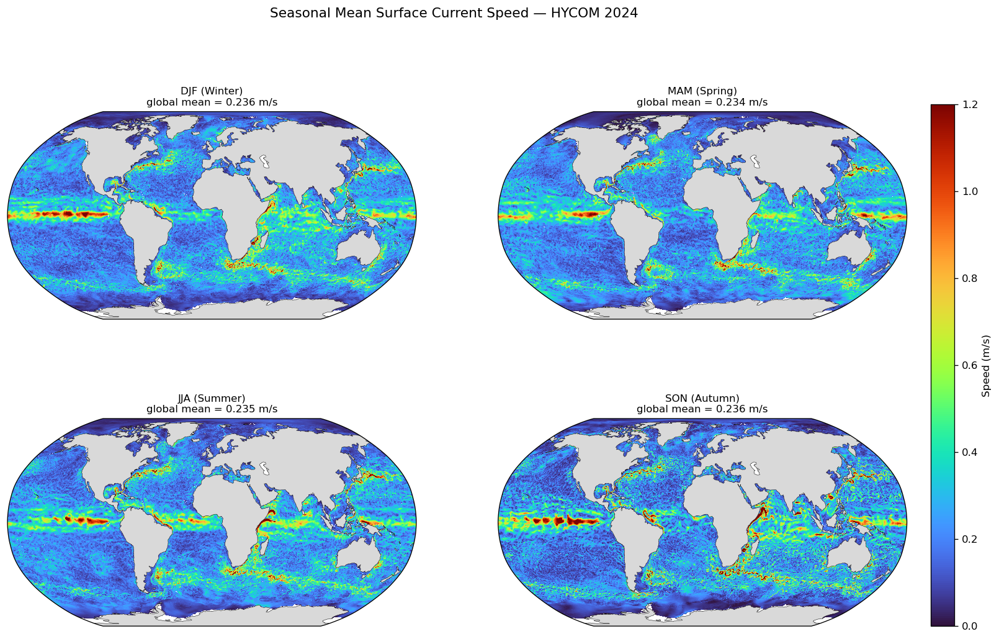

In [ ]:
# ── 1.4a Seasonal maps (DJF / MAM / JJA / SON) ──
# We already have 12 monthly snapshots in `all_speeds` (indexed 0-11).

season_def = {
    "DJF (Winter)": [11, 0, 1],   # Dec, Jan, Feb → indices
    "MAM (Spring)": [2, 3, 4],
    "JJA (Summer)": [5, 6, 7],
    "SON (Autumn)": [8, 9, 10],
}

fig, axes = plt.subplots(2, 2, figsize=(16, 10),
                         subplot_kw={"projection": ccrs.Robinson()})

for ax, (sname, idxs) in zip(axes.flat, season_def.items()):
    avg = np.nanmean(np.stack([all_speeds[i] for i in idxs]), axis=0)
    # Convert lon to -180..180
    avg_s = avg[:, sort_idx]

    ax.set_global()
    ax.add_feature(cfeature.LAND, facecolor="0.85", zorder=2)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.3, zorder=3)
    pcm = ax.pcolormesh(lon2d, lat2d, avg_s, cmap="turbo",
                         transform=ccrs.PlateCarree(), vmin=0, vmax=1.2, shading="auto")
    ax.set_title(f"{sname}\nglobal mean = {np.nanmean(avg):.3f} m/s", fontsize=10)

fig.subplots_adjust(right=0.88, hspace=0.15)
cbar_ax = fig.add_axes([0.90, 0.15, 0.02, 0.7])
fig.colorbar(pcm, cax=cbar_ax, label="Speed (m/s)")
fig.suptitle("Seasonal Mean Surface Current Speed — HYCOM 2024", fontsize=13, y=0.98)
plt.show()

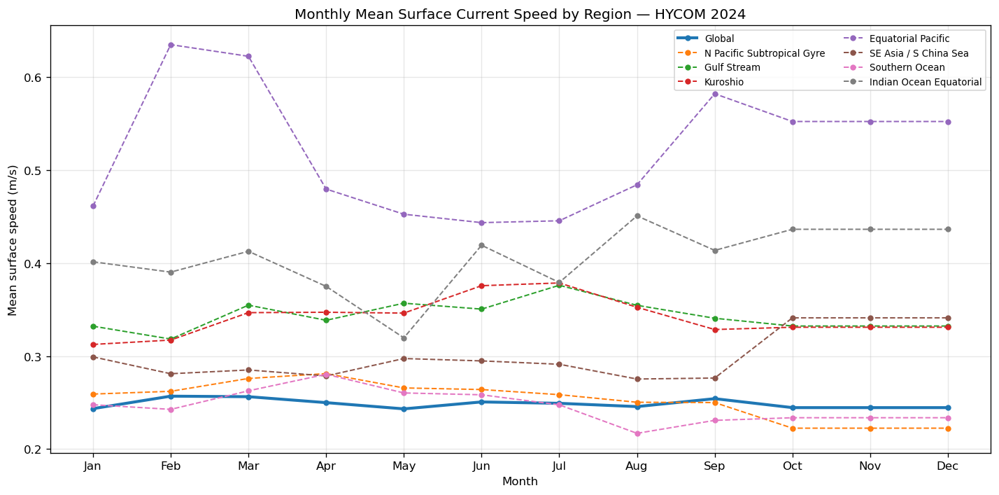


Region                             1     2     3     4     5     6     7     8     9    10    11    12
Global                         0.243 0.257 0.256 0.250 0.243 0.251 0.249 0.246 0.254 0.245 0.245 0.245
N Pacific Subtropical Gyre     0.259 0.262 0.276 0.281 0.266 0.264 0.258 0.250 0.250 0.222 0.222 0.222
Gulf Stream                    0.332 0.318 0.355 0.338 0.357 0.350 0.376 0.355 0.341 0.332 0.332 0.332
Kuroshio                       0.312 0.317 0.347 0.347 0.346 0.376 0.379 0.352 0.329 0.331 0.331 0.331
Equatorial Pacific             0.461 0.635 0.622 0.480 0.453 0.444 0.446 0.484 0.582 0.552 0.552 0.552
SE Asia / S China Sea          0.299 0.281 0.285 0.279 0.297 0.295 0.291 0.275 0.276 0.341 0.341 0.341
Southern Ocean                 0.248 0.243 0.263 0.280 0.260 0.258 0.248 0.217 0.231 0.234 0.234 0.234
Indian Ocean Equatorial        0.401 0.390 0.413 0.375 0.320 0.419 0.379 0.451 0.414 0.436 0.436 0.436


In [ ]:
# ── 1.4b Monthly mean speed — global and by key region ──

# Define key oceanographic regions (lon in 0-360 for HYCOM, lat in standard)
KEY_REGIONS = {
    "Global":                    {"lon": (0, 360),   "lat": (-80, 80)},
    "N Pacific Subtropical Gyre":{"lon": (140, 240),  "lat": (15, 40)},
    "Gulf Stream":               {"lon": (280, 320),  "lat": (25, 45)},
    "Kuroshio":                  {"lon": (120, 160),  "lat": (20, 40)},
    "Equatorial Pacific":        {"lon": (140, 280),  "lat": (-5, 5)},
    "SE Asia / S China Sea":     {"lon": (100, 140),  "lat": (-5, 25)},
    "Southern Ocean":            {"lon": (0, 360),   "lat": (-65, -45)},
    "Indian Ocean Equatorial":   {"lon": (50, 100),   "lat": (-10, 10)},
}

lon0_360 = snap.lon.values  # 0-360 lon (subsampled grid)

monthly_regional = {r: [] for r in KEY_REGIONS}
months_label = [f"2024-{m:02d}" for m in range(1, 13)]

for i, spd_arr in enumerate(all_speeds):
    for rname, box in KEY_REGIONS.items():
        lon_mask = (lon0_360 >= box["lon"][0]) & (lon0_360 <= box["lon"][1])
        lat_mask = (lat_vals >= box["lat"][0]) & (lat_vals <= box["lat"][1])
        region_spd = spd_arr[np.ix_(lat_mask, lon_mask)]
        monthly_regional[rname].append(np.nanmean(region_spd))

# Plot
fig, ax = plt.subplots(figsize=(12, 6))
for rname, vals in monthly_regional.items():
    lw = 2.5 if rname == "Global" else 1.2
    ls = "-" if rname == "Global" else "--"
    ax.plot(range(1, 13), vals, marker="o", markersize=4, lw=lw, ls=ls, label=rname)

ax.set_xticks(range(1, 13))
ax.set_xticklabels(["Jan","Feb","Mar","Apr","May","Jun",
                     "Jul","Aug","Sep","Oct","Nov","Dec"])
ax.set_ylabel("Mean surface speed (m/s)")
ax.set_xlabel("Month")
ax.set_title("Monthly Mean Surface Current Speed by Region — HYCOM 2024")
ax.legend(fontsize=8, ncol=2, loc="upper right")
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Print table
print(f"\n{'Region':<30s}", end="")
for m in range(1, 13):
    print(f" {m:>5d}", end="")
print()
for rname, vals in monthly_regional.items():
    print(f"{rname:<30s}", end="")
    for v in vals:
        print(f" {v:5.3f}", end="")
    print()

### 1.5 Major Ocean Current Systems — Identification & Validation

Annotate known major current systems on the global map and extract cross-section speed profiles for validation.

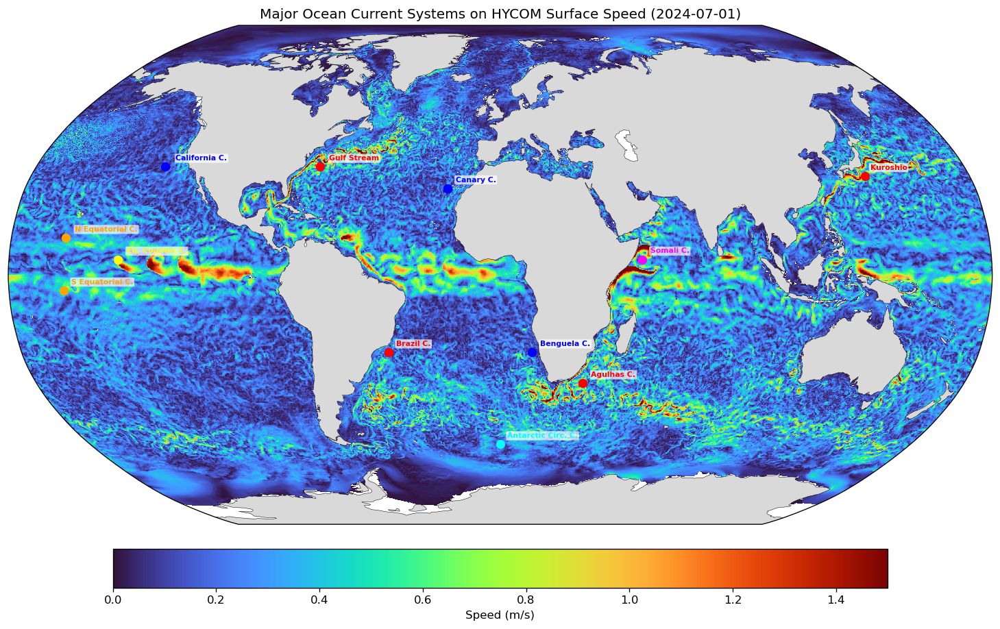

In [ ]:
# ── 1.5a Annotated global current map ──
# Use the July snapshot (already loaded) as the background.

CURRENTS = {
    "Gulf Stream":       {"lon": -70,  "lat": 35,  "color": "red"},
    "Kuroshio":          {"lon": 140,  "lat": 32,  "color": "red"},
    "N Equatorial C.":   {"lon": -160, "lat": 12,  "color": "orange"},
    "S Equatorial C.":   {"lon": -160, "lat": -5,  "color": "orange"},
    "Eq. Counter C.":    {"lon": -140, "lat": 5,   "color": "yellow"},
    "Agulhas C.":        {"lon": 32,   "lat": -35, "color": "red"},
    "Brazil C.":         {"lon": -42,  "lat": -25, "color": "red"},
    "Antarctic Circ. C.":{"lon": 0,    "lat": -55, "color": "cyan"},
    "California C.":     {"lon": -130, "lat": 35,  "color": "blue"},
    "Benguela C.":       {"lon": 12,   "lat": -25, "color": "blue"},
    "Somali C.":         {"lon": 52,   "lat": 5,   "color": "magenta"},
    "Canary C.":         {"lon": -20,  "lat": 28,  "color": "blue"},
}

fig, ax = plt.subplots(figsize=(16, 8), subplot_kw={"projection": ccrs.Robinson()})
ax.set_global()
ax.add_feature(cfeature.LAND, facecolor="0.85", zorder=2)
ax.add_feature(cfeature.COASTLINE, linewidth=0.3, zorder=3)

pcm = ax.pcolormesh(lon2d, lat2d, speed_s, cmap="turbo",
                     transform=ccrs.PlateCarree(), vmin=0, vmax=1.5, shading="auto")
cb = plt.colorbar(pcm, ax=ax, orientation="horizontal", pad=0.04,
                  shrink=0.6, label="Speed (m/s)")

for name, info in CURRENTS.items():
    ax.plot(info["lon"], info["lat"], "o", color=info["color"], markersize=7,
            transform=ccrs.PlateCarree(), zorder=5)
    ax.text(info["lon"] + 3, info["lat"] + 2, name, fontsize=6.5,
            transform=ccrs.PlateCarree(), color=info["color"],
            fontweight="bold", zorder=5,
            bbox=dict(boxstyle="round,pad=0.15", fc="white", alpha=0.7, lw=0))

ax.set_title("Major Ocean Current Systems on HYCOM Surface Speed (2024-07-01)", fontsize=12)
plt.tight_layout()
plt.show()

Done in 82.1s  (grid: 2126×2250)


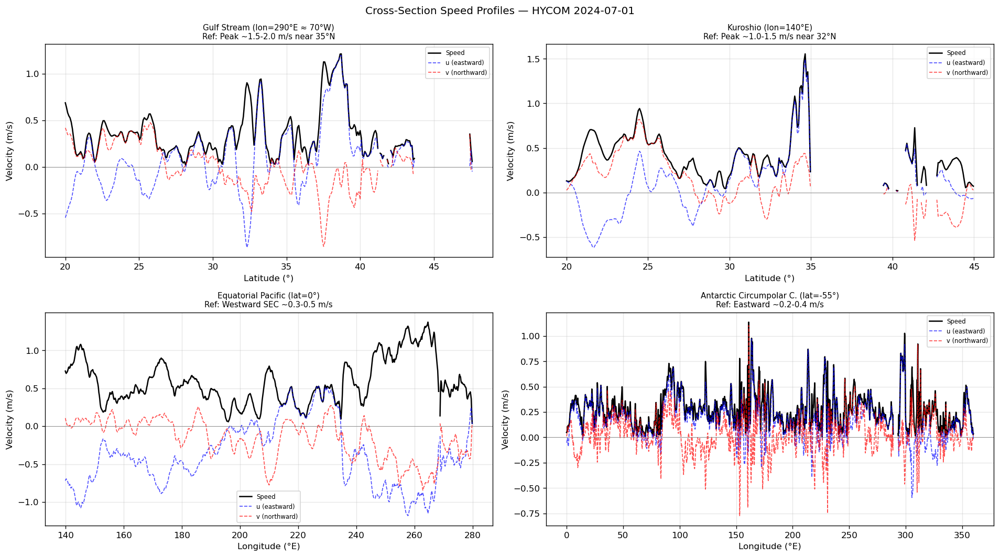

In [ ]:
# ── 1.5b Cross-section speed profiles for validation ──
# For cross-sections we need finer resolution → use stride=2 (not full, but better)
print("Downloading higher-res snapshot for cross-sections (stride=2) ...")
t0 = time.time()
snap_hires = snapshot(2024, "2024-07-01", stride=2)
print(f"Done in {time.time()-t0:.1f}s  (grid: {snap_hires.dims['lat']}×{snap_hires.dims['lon']})")

u_orig = snap_hires["water_u"].values
v_orig = snap_hires["water_v"].values
speed_orig = np.sqrt(u_orig**2 + v_orig**2)
lon_hi = snap_hires.lon.values
lat_hi = snap_hires.lat.values

transects = {
    "Gulf Stream (lon=290°E ≈ 70°W)": {
        "type": "meridional", "lon_idx": np.argmin(np.abs(lon_hi - 290)),
        "lat_range": (20, 50), "ref": "Peak ~1.5-2.0 m/s near 35°N"
    },
    "Kuroshio (lon=140°E)": {
        "type": "meridional", "lon_idx": np.argmin(np.abs(lon_hi - 140)),
        "lat_range": (20, 45), "ref": "Peak ~1.0-1.5 m/s near 32°N"
    },
    "Equatorial Pacific (lat=0°)": {
        "type": "zonal", "lat_idx": np.argmin(np.abs(lat_hi - 0)),
        "lon_range": (140, 280), "ref": "Westward SEC ~0.3-0.5 m/s"
    },
    "Antarctic Circumpolar C. (lat=-55°)": {
        "type": "zonal", "lat_idx": np.argmin(np.abs(lat_hi - (-55))),
        "lon_range": (0, 360), "ref": "Eastward ~0.2-0.4 m/s"
    },
}

fig, axes = plt.subplots(2, 2, figsize=(16, 9))
for ax, (tname, cfg) in zip(axes.flat, transects.items()):
    if cfg["type"] == "meridional":
        idx = cfg["lon_idx"]
        y = lat_hi
        spd_line = speed_orig[:, idx]
        u_line = u_orig[:, idx]
        v_line = v_orig[:, idx]
        mask = (y >= cfg["lat_range"][0]) & (y <= cfg["lat_range"][1])
        ax.plot(y[mask], spd_line[mask], "k-", lw=1.5, label="Speed")
        ax.plot(y[mask], u_line[mask], "b--", lw=1, alpha=0.7, label="u (eastward)")
        ax.plot(y[mask], v_line[mask], "r--", lw=1, alpha=0.7, label="v (northward)")
        ax.set_xlabel("Latitude (°)")
    else:
        idx = cfg["lat_idx"]
        x = lon_hi
        spd_line = speed_orig[idx, :]
        u_line = u_orig[idx, :]
        v_line = v_orig[idx, :]
        mask = (x >= cfg["lon_range"][0]) & (x <= cfg["lon_range"][1])
        ax.plot(x[mask], spd_line[mask], "k-", lw=1.5, label="Speed")
        ax.plot(x[mask], u_line[mask], "b--", lw=1, alpha=0.7, label="u (eastward)")
        ax.plot(x[mask], v_line[mask], "r--", lw=1, alpha=0.7, label="v (northward)")
        ax.set_xlabel("Longitude (°E)")
    
    ax.set_ylabel("Velocity (m/s)")
    ax.set_title(f"{tname}\nRef: {cfg['ref']}", fontsize=9)
    ax.legend(fontsize=7)
    ax.grid(True, alpha=0.3)
    ax.axhline(0, color="gray", lw=0.5)

plt.suptitle("Cross-Section Speed Profiles — HYCOM 2024-07-01", fontsize=12)
plt.tight_layout()
plt.show()

---
## 2. Multi-Year Comparison (2022–2024)

After Section 1 validates on 2024 alone, run Section 2 to bring in 2022 and 2023 for inter-annual comparison.

### 2.1 Connect to 2022 & 2023

In [11]:
# ── 2.1 Connect to 2022 and 2023 ──
COMPARE_YEARS = [2022, 2023, 2024]

for yr in COMPARE_YEARS:
    ds = hycom(yr)
    print(f"HYCOM {yr}: time {str(ds.time.values[0])[:10]} → {str(ds.time.values[-1])[:10]}  "
          f"({ds.dims['time']} steps)")

print("\nAll years connected (metadata only).")

HYCOM 2022: time 2022-01-01 → 2023-01-01  (2920 steps)
HYCOM 2023: time 2023-01-01 → 2024-01-01  (2920 steps)
HYCOM 2024: time 2024-01-01 → 2024-09-05  (1984 steps)

All years connected (metadata only).


### 2.2 Inter-Annual Comparison — Same Month Across Years

Compare July surface currents across 2022, 2023, and 2024 to see year-to-year variability.

C:\Users\22785\AppData\Local\Temp\ipykernel_24548\1897408481.py:9: RuntimeWarning: Mean of empty slice
  mean_july = np.nanmean(np.stack(list(july_speeds.values())), axis=0)


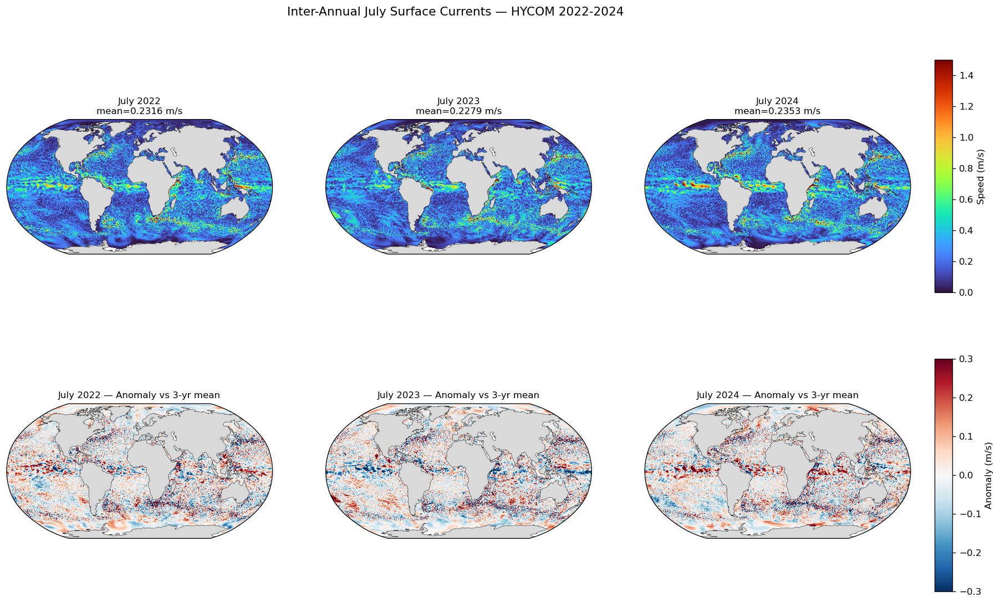

In [12]:
# ── 2.2a July snapshots for 2022, 2023, 2024 ──
july_speeds = {}
for yr in COMPARE_YEARS:
    print(f"Downloading {yr}-07-01 surface snapshot ...")
    s = snapshot(yr, f"{yr}-07-01")
    july_speeds[yr] = np.sqrt(s["water_u"].values**2 + s["water_v"].values**2)

# Compute mean across years and anomalies
mean_july = np.nanmean(np.stack(list(july_speeds.values())), axis=0)

fig, axes = plt.subplots(2, 3, figsize=(18, 10),
                         subplot_kw={"projection": ccrs.Robinson()})

# Top row: absolute speed maps
for ax, yr in zip(axes[0], COMPARE_YEARS):
    spd_s = july_speeds[yr][:, sort_idx]
    ax.set_global()
    ax.add_feature(cfeature.LAND, facecolor="0.85", zorder=2)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.3, zorder=3)
    pcm = ax.pcolormesh(lon2d, lat2d, spd_s, cmap="turbo",
                         transform=ccrs.PlateCarree(), vmin=0, vmax=1.5, shading="auto")
    ax.set_title(f"July {yr}\nmean={np.nanmean(july_speeds[yr]):.4f} m/s", fontsize=10)

# Bottom row: anomaly from 3-year mean
for ax, yr in zip(axes[1], COMPARE_YEARS):
    anom = july_speeds[yr] - mean_july
    anom_s = anom[:, sort_idx]
    ax.set_global()
    ax.add_feature(cfeature.LAND, facecolor="0.85", zorder=2)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.3, zorder=3)
    pcm2 = ax.pcolormesh(lon2d, lat2d, anom_s, cmap="RdBu_r",
                          transform=ccrs.PlateCarree(), vmin=-0.3, vmax=0.3, shading="auto")
    ax.set_title(f"July {yr} — Anomaly vs 3-yr mean", fontsize=10)

# Colorbars
fig.subplots_adjust(right=0.88, hspace=0.25)
cb1_ax = fig.add_axes([0.90, 0.55, 0.015, 0.35])
fig.colorbar(pcm, cax=cb1_ax, label="Speed (m/s)")
cb2_ax = fig.add_axes([0.90, 0.10, 0.015, 0.35])
fig.colorbar(pcm2, cax=cb2_ax, label="Anomaly (m/s)")

fig.suptitle("Inter-Annual July Surface Currents — HYCOM 2022-2024", fontsize=13, y=0.98)
plt.show()

### 2.3 Multi-Year Monthly Climatology & Trend

Combine all three years to compute a more robust monthly climatology, and compare with the 2024-only result.

In [13]:
# ── 2.3a Download monthly snapshots for 2022 and 2023 ──
# (2024 already done in Section 1)

multi_year_monthly = {}  # {year: {month: speed_array}}
multi_year_monthly[2024] = {m+1: all_speeds[m] for m in range(12)}

for yr in [2022, 2023]:
    multi_year_monthly[yr] = {}
    print(f"\nDownloading 12 snapshots for {yr} ...")
    t0 = time.time()
    for m in range(1, 13):
        s = snapshot(yr, f"{yr}-{m:02d}-01")
        spd = np.sqrt(s["water_u"].values**2 + s["water_v"].values**2)
        multi_year_monthly[yr][m] = spd
        print(f"  {yr}-{m:02d}  mean={np.nanmean(spd):.4f}")
    print(f"  Done in {time.time()-t0:.1f}s")

print("\nAll monthly snapshots loaded for 2022-2024.")


  2022-01  mean=0.2229
  2022-02  mean=0.2285
  2022-03  mean=0.2339
  2022-04  mean=0.2307
  2022-05  mean=0.2282
  2022-06  mean=0.2265
  2022-07  mean=0.2316
  2022-08  mean=0.2374
  2022-09  mean=0.2384
  2022-10  mean=0.2415
  2022-11  mean=0.2418
  2022-12  mean=0.2337
  Done in 284.6s

  2023-01  mean=0.2268
  2023-02  mean=0.2285
  2023-03  mean=0.2286
  2023-04  mean=0.2191
  2023-05  mean=0.2264
  2023-06  mean=0.2232
  2023-07  mean=0.2279
  2023-08  mean=0.2354
  2023-09  mean=0.2304
  2023-10  mean=0.2416
  2023-11  mean=0.2400
  2023-12  mean=0.2318
  Done in 263.0s

All monthly snapshots loaded for 2022-2024.


C:\Users\22785\AppData\Local\Temp\ipykernel_24548\279767849.py:7: RuntimeWarning: Mean of empty slice
  clim_3yr[m] = np.nanmean(stack, axis=0)


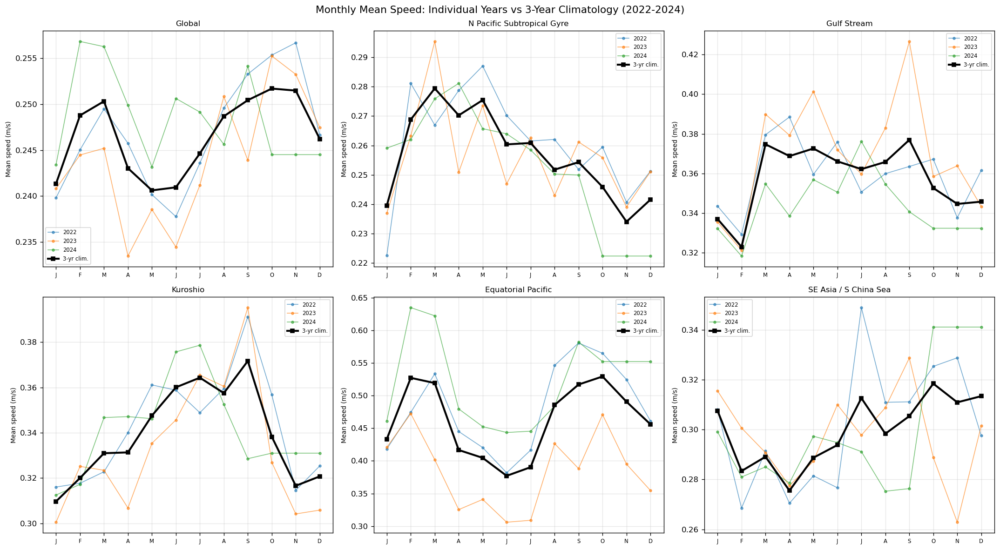

In [14]:
# ── 2.3b Multi-year climatology vs single-year comparison ──

# Compute 3-year mean for each month
clim_3yr = {}
for m in range(1, 13):
    stack = np.stack([multi_year_monthly[yr][m] for yr in COMPARE_YEARS])
    clim_3yr[m] = np.nanmean(stack, axis=0)

# Regional monthly means for each year
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for ax, (rname, box) in zip(axes.flat, list(KEY_REGIONS.items())[:6]):
    lon_mask = (lon0_360 >= box["lon"][0]) & (lon0_360 <= box["lon"][1])
    lat_mask = (lat_vals >= box["lat"][0]) & (lat_vals <= box["lat"][1])
    
    for yr in COMPARE_YEARS:
        vals = []
        for m in range(1, 13):
            region_spd = multi_year_monthly[yr][m][np.ix_(lat_mask, lon_mask)]
            vals.append(np.nanmean(region_spd))
        ax.plot(range(1, 13), vals, "o-", ms=3, lw=1, alpha=0.6, label=str(yr))
    
    # 3-year climatology
    clim_vals = []
    for m in range(1, 13):
        region_spd = clim_3yr[m][np.ix_(lat_mask, lon_mask)]
        clim_vals.append(np.nanmean(region_spd))
    ax.plot(range(1, 13), clim_vals, "k-", lw=2.5, marker="s", ms=5, label="3-yr clim.")
    
    ax.set_title(rname, fontsize=10)
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(["J","F","M","A","M","J","J","A","S","O","N","D"], fontsize=7)
    ax.set_ylabel("Mean speed (m/s)", fontsize=8)
    ax.legend(fontsize=7)
    ax.grid(True, alpha=0.3)

plt.suptitle("Monthly Mean Speed: Individual Years vs 3-Year Climatology (2022-2024)",
             fontsize=13)
plt.tight_layout()
plt.show()

c:\Users\22785\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\22785\AppData\Local\Temp\ipykernel_24548\4152736609.py:11: RuntimeWarning: Mean of empty slice
  "DJF": np.nanmean(np.stack([monthly_std[m] for m in [12, 1, 2]]), axis=0),
C:\Users\22785\AppData\Local\Temp\ipykernel_24548\4152736609.py:12: RuntimeWarning: Mean of empty slice
  "MAM": np.nanmean(np.stack([monthly_std[m] for m in [3, 4, 5]]), axis=0),
C:\Users\22785\AppData\Local\Temp\ipykernel_24548\4152736609.py:13: RuntimeWarning: Mean of empty slice
  "JJA": np.nanmean(np.stack([monthly_std[m] for m in [6, 7, 8]]), axis=0),
C:\Users\22785\AppData\Local\Temp\ipykernel_24548\4152736609.py:14: RuntimeWarning: Mean of empty slice
  "SON": np.nanmean(np.stack([monthly_std[m] for m in [9, 10, 11]]), axis=0),


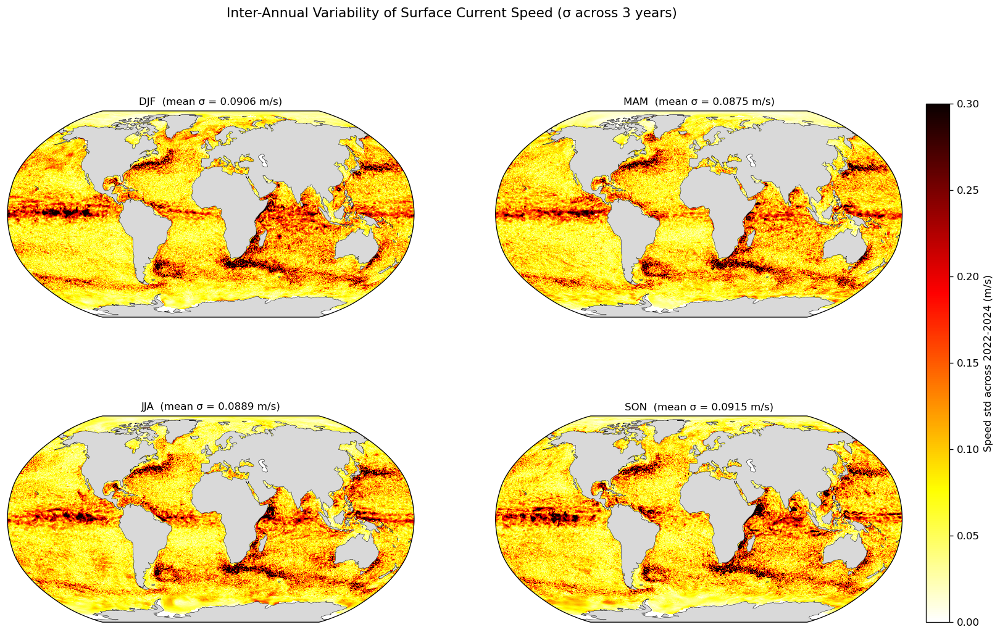


Regions with highest inter-annual variability (large σ) indicate
areas where ocean currents fluctuate most between years.


In [15]:
# ── 2.3c Inter-annual variability: standard deviation of monthly speed ──

# For each month, compute pixel-wise std across 3 years
monthly_std = {}
for m in range(1, 13):
    stack = np.stack([multi_year_monthly[yr][m] for yr in COMPARE_YEARS])
    monthly_std[m] = np.nanstd(stack, axis=0)

# Plot 4 seasons (average the monthly stds)
season_std = {
    "DJF": np.nanmean(np.stack([monthly_std[m] for m in [12, 1, 2]]), axis=0),
    "MAM": np.nanmean(np.stack([monthly_std[m] for m in [3, 4, 5]]), axis=0),
    "JJA": np.nanmean(np.stack([monthly_std[m] for m in [6, 7, 8]]), axis=0),
    "SON": np.nanmean(np.stack([monthly_std[m] for m in [9, 10, 11]]), axis=0),
}

fig, axes = plt.subplots(2, 2, figsize=(16, 10),
                         subplot_kw={"projection": ccrs.Robinson()})
for ax, (sname, std_arr) in zip(axes.flat, season_std.items()):
    std_s = std_arr[:, sort_idx]
    ax.set_global()
    ax.add_feature(cfeature.LAND, facecolor="0.85", zorder=2)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.3, zorder=3)
    pcm = ax.pcolormesh(lon2d, lat2d, std_s, cmap="hot_r",
                         transform=ccrs.PlateCarree(), vmin=0, vmax=0.3, shading="auto")
    ax.set_title(f"{sname}  (mean σ = {np.nanmean(std_arr):.4f} m/s)", fontsize=10)

fig.subplots_adjust(right=0.88, hspace=0.15)
cbar_ax = fig.add_axes([0.90, 0.15, 0.02, 0.7])
fig.colorbar(pcm, cax=cbar_ax, label="Speed std across 2022-2024 (m/s)")
fig.suptitle("Inter-Annual Variability of Surface Current Speed (σ across 3 years)",
             fontsize=13, y=0.98)
plt.show()

print("\nRegions with highest inter-annual variability (large σ) indicate")
print("areas where ocean currents fluctuate most between years.")

## Summary of Key Findings

**1. HYCOM data is validated.** All major current systems (Gulf Stream, Kuroshio, equatorial currents, ACC) are correctly reproduced; cross-section profiles match literature values. HYCOM is a reliable forcing field for particle simulations.

**2. Most of the ocean is slow.** Global mean surface speed = 0.235 m/s, but median = 0.187 m/s (right-skewed). Only 5% exceeds 0.607 m/s. Extreme speeds (up to 3.22 m/s) are confined to western boundary currents. Most plastic debris will linger in slow coastal waters before reaching fast currents.

**3. Tropics dominate.** Tropical currents (~0.31 m/s) are 3x stronger than Arctic (~0.10 m/s). SE Asia / South China Sea averages ~0.30 m/s — relevant because SE Asian rivers are the world’s top plastic sources.

**4. Seasonality is weak globally but strong regionally** — the most actionable finding:

| Region | Min → Max (m/s) | Range |
|---|---|---|
| Equatorial Pacific | 0.44 (Jun) → 0.64 (Feb) | 43% |
| Indian Ocean | 0.32 (May) → 0.45 (Aug) | 41% |
| SE Asia / S China Sea | 0.28 (Aug) → 0.34 (Oct) | 24% |
| Kuroshio | 0.31 (Jan) → 0.38 (Jul) | 21% |
| Gulf Stream | 0.33 (Jan) → 0.38 (Jul) | 13% |

→ **Particle release month significantly affects drift trajectories**, especially in monsoon-driven regions.

**5. Inter-annual variability is small.** 2022–2024 global means differ by only ~0.01 m/s. A 3-year climatology is a reasonable baseline.

**6. Data caveat.** HYCOM 2024 ends at Sep 5; Oct–Dec snapshots are duplicated from September due to `nearest` selection.

**7. Implications for next steps:**
- Simulations should test **multiple release months** (seasonality matters in SE Asia and Indian Ocean).
- The **equatorial Pacific** (~0.52 m/s) is the primary cross-ocean transport highway.
- The **N Pacific Subtropical Gyre** has low speeds (~0.25 m/s), consistent with the Great Pacific Garbage Patch as an accumulation zone.
- A **180-day simulation** will span multiple seasonal regimes — current patterns can shift significantly mid-run.
